#                              Micro Credit Defaulter

### Problem Statement:

Build a model which can be used to predict in terms of a probability for each loan transaction, whether the customer will be paying back the loaned amount within 5 days of insurance of loan. In this case, Label ‘1’ indicates that the loan has been payed i.e. Non- defaulter, while, Label ‘0’ indicates that the loan has not been payed i.e. defaulter. 

#### Data Description

### Import Libraries

In [76]:
# import all the libraries

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
pd.set_option("display.max_columns",None)
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import BernoulliNB
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import r2_score
from dataprep.eda import create_report

### Load the Dataset

In [77]:
# Load the dataset 

df= pd.read_csv("C:/Users/HP/anaconda3/DataScience/FlipRobo/Micro-Credit-Project--3-/Micro Credit Project/Data file.csv")

In [78]:
# we will look at first 5 records

df.head()

,Unnamed: 0,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pcircle,pdate
0,1,0,21408I70789,272.0,3055.050000,3065.150000,220.13,260.13,2.0,0.0,1539,2,21.0,3078.0,1539.0,7.50,2,21,3078,1539.0,7.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,29.000000,29.000000,UPW,2016-07-20
1,2,1,76462I70374,712.0,12122.000000,12124.750000,3691.26,3691.26,20.0,0.0,5787,1,0.0,5787.0,5787.0,61.04,1,0,5787,5787.0,61.04,0.0,0.0,0,0,1,12,12.0,0.0,1.0,12,12,0.0,0.000000,0.000000,UPW,2016-08-10
2,3,1,17943I70372,535.0,1398.000000,1398.000000,900.13,900.13,3.0,0.0,1539,1,0.0,1539.0,1539.0,66.32,1,0,1539,1539.0,66.32,0.0,0.0,0,0,1,6,6.0,0.0,1.0,6,6,0.0,0.000000,0.000000,UPW,2016-08-19
3,4,1,55773I70781,241.0,21.228000,21.228000,159.42,159.42,41.0,0.0,947,0,0.0,0.0,0.0,0.00,1,0,947,947.0,2.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,0.000000,0.000000,UPW,2016-06-06
4,5,1,03813I82730,947.0,150.619333,150.619333,1098.90,1098.90,4.0,0.0,2309,7,2.0,20029.0,2309.0,29.00,8,2,23496,2888.0,35.00,0.0,0.0,0,0,7,42,6.0,0.0,7.0,42,6,0.0,2.333333,2.333333,UPW,2016-06-22


### Exploratory Data Analysis

In [79]:
# check the value counts of the pcircle since it looks like we have only one data in the entire dataeset

df.pcircle.value_counts()

UPW    209593
Name: pcircle, dtype: int64

we found it right that we had only one data "UPW" in the entire dataset for the feature pcircle.So its not usefull because it wont make any difference in predicting the target variable

In [80]:
# we will find the shape of the dataset

df.shape

(209593, 37)

In [81]:
# we will find the datatypes of the dataset

df.dtypes

Unnamed: 0                int64
label                     int64
msisdn                   object
aon                     float64
daily_decr30            float64
daily_decr90            float64
rental30                float64
rental90                float64
last_rech_date_ma       float64
last_rech_date_da       float64
last_rech_amt_ma          int64
cnt_ma_rech30             int64
fr_ma_rech30            float64
sumamnt_ma_rech30       float64
medianamnt_ma_rech30    float64
medianmarechprebal30    float64
cnt_ma_rech90             int64
fr_ma_rech90              int64
sumamnt_ma_rech90         int64
medianamnt_ma_rech90    float64
medianmarechprebal90    float64
cnt_da_rech30           float64
fr_da_rech30            float64
cnt_da_rech90             int64
fr_da_rech90              int64
cnt_loans30               int64
amnt_loans30              int64
maxamnt_loans30         float64
medianamnt_loans30      float64
cnt_loans90             float64
amnt_loans90              int64
maxamnt_

pdate is of the type object so we will convert the datatype into suitable datatype for our analysis ie, Datetime.

In [82]:
df.pdate = pd.DatetimeIndex(df.pdate)

We will split the pdate into day,month & year for our further analysis

In [83]:
df['day'] = df.pdate.dt.day

In [84]:
df['month'] = df.pdate.dt.month

In [85]:
df['year'] = df.pdate.dt.year

In [86]:
# we will look at the data after splitting of the pdate feature

df.head()

,Unnamed: 0,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pcircle,pdate,day,month,year
0,1,0,21408I70789,272.0,3055.050000,3065.150000,220.13,260.13,2.0,0.0,1539,2,21.0,3078.0,1539.0,7.50,2,21,3078,1539.0,7.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,29.000000,29.000000,UPW,2016-07-20,20,7,2016
1,2,1,76462I70374,712.0,12122.000000,12124.750000,3691.26,3691.26,20.0,0.0,5787,1,0.0,5787.0,5787.0,61.04,1,0,5787,5787.0,61.04,0.0,0.0,0,0,1,12,12.0,0.0,1.0,12,12,0.0,0.000000,0.000000,UPW,2016-08-10,10,8,2016
2,3,1,17943I70372,535.0,1398.000000,1398.000000,900.13,900.13,3.0,0.0,1539,1,0.0,1539.0,1539.0,66.32,1,0,1539,1539.0,66.32,0.0,0.0,0,0,1,6,6.0,0.0,1.0,6,6,0.0,0.000000,0.000000,UPW,2016-08-19,19,8,2016
3,4,1,55773I70781,241.0,21.228000,21.228000,159.42,159.42,41.0,0.0,947,0,0.0,0.0,0.0,0.00,1,0,947,947.0,2.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,0.000000,0.000000,UPW,2016-06-06,6,6,2016
4,5,1,03813I82730,947.0,150.619333,150.619333,1098.90,1098.90,4.0,0.0,2309,7,2.0,20029.0,2309.0,29.00,8,2,23496,2888.0,35.00,0.0,0.0,0,0,7,42,6.0,0.0,7.0,42,6,0.0,2.333333,2.333333,UPW,2016-06-22,22,6,2016


In [87]:
# we will look at the value_counts of the day feature to have clear picture of the data captured dates

df.day.value_counts()

11    8092
10    8050
6     8030
12    8028
7     8026
5     7989
13    7969
8     7899
2     7839
1     7824
15    7820
14    7816
9     7717
17    7643
3     7607
16    7556
18    7305
4     7154
19    6857
20    6729
21    5964
23    5816
22    5753
27    5283
25    5269
26    5174
30    5129
24    5103
29    5077
28    4897
31    2178
Name: day, dtype: int64

In [88]:
# we will get a copy of the dataframe

df_new=df.copy

In [89]:
# we will drop the features which are not usefull for our analysis

df_new=df.drop(['Unnamed: 0','label','pdate','msisdn','pcircle'],axis=1)

In [90]:
df_new.head()

,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,day,month,year
0,272.0,3055.050000,3065.150000,220.13,260.13,2.0,0.0,1539,2,21.0,3078.0,1539.0,7.50,2,21,3078,1539.0,7.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,29.000000,29.000000,20,7,2016
1,712.0,12122.000000,12124.750000,3691.26,3691.26,20.0,0.0,5787,1,0.0,5787.0,5787.0,61.04,1,0,5787,5787.0,61.04,0.0,0.0,0,0,1,12,12.0,0.0,1.0,12,12,0.0,0.000000,0.000000,10,8,2016
2,535.0,1398.000000,1398.000000,900.13,900.13,3.0,0.0,1539,1,0.0,1539.0,1539.0,66.32,1,0,1539,1539.0,66.32,0.0,0.0,0,0,1,6,6.0,0.0,1.0,6,6,0.0,0.000000,0.000000,19,8,2016
3,241.0,21.228000,21.228000,159.42,159.42,41.0,0.0,947,0,0.0,0.0,0.0,0.00,1,0,947,947.0,2.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,0.000000,0.000000,6,6,2016
4,947.0,150.619333,150.619333,1098.90,1098.90,4.0,0.0,2309,7,2.0,20029.0,2309.0,29.00,8,2,23496,2888.0,35.00,0.0,0.0,0,0,7,42,6.0,0.0,7.0,42,6,0.0,2.333333,2.333333,22,6,2016


In [91]:
df_new.describe()

,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,day,month,year
count,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.00000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.00000,209593.000000,209593.0
mean,8112.343445,5381.402289,6082.515068,2692.581910,3483.406534,3755.847800,3712.202921,2064.452797,3.978057,3737.355121,7704.501157,1812.817952,3851.927942,6.31543,7.716780,12396.218352,1864.595821,92.025541,262.578110,3749.494447,0.041495,0.045712,2.758981,17.952021,274.658747,0.054029,18.520919,23.645398,6.703134,0.046077,3.398826,4.321485,14.39894,6.797321,2016.0
std,75696.082531,9220.623400,10918.812767,4308.586781,5770.461279,53905.892230,53374.833430,2370.786034,4.256090,53643.625172,10139.621714,2070.864620,54006.374433,7.19347,12.590251,16857.793882,2081.680664,369.215658,4183.897978,53885.414979,0.397556,0.951386,2.554502,17.379741,4245.264648,0.218039,224.797423,26.469861,2.103864,0.200692,8.813729,10.308108,8.43890,0.741435,0.0
min,-48.000000,-93.012667,-93.012667,-23737.140000,-24720.580000,-29.000000,-29.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-200.000000,0.00000,0.000000,0.000000,0.000000,-200.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.00000,6.000000,2016.0
25%,246.000000,42.440000,42.692000,280.420000,300.260000,1.000000,0.000000,770.000000,1.000000,0.000000,1540.000000,770.000000,11.000000,2.00000,0.000000,2317.000000,773.000000,14.600000,0.000000,0.000000,0.000000,0.000000,1.000000,6.000000,6.000000,0.000000,1.000000,6.000000,6.000000,0.000000,0.000000,0.000000,7.00000,6.000000,2016.0
50%,527.000000,1469.175667,1500.000000,1083.570000,1334.000000,3.000000,0.000000,1539.000000,3.000000,2.000000,4628.000000,1539.000000,33.900000,4.00000,2.000000,7226.000000,1539.000000,36.000000,0.000000,0.000000,0.000000,0.000000,2.000000,12.000000,6.000000,0.000000,2.000000,12.000000,6.000000,0.000000,0.000000,1.666667,14.00000,7.000000,2016.0
75%,982.000000,7244.000000,7802.790000,3356.940000,4201.790000,7.000000,0.000000,2309.000000,5.000000,6.000000,10010.000000,1924.000000,83.000000,8.00000,8.000000,16000.000000,1924.000000,79.310000,0.000000,0.000000,0.000000,0.000000,4.000000,24.000000,6.000000,0.000000,5.000000,30.000000,6.000000,0.000000,3.750000,4.500000,21.00000,7.000000,2016.0
max,999860.755168,265926.000000,320630.000000,198926.110000,200148.110000,998650.377733,999171.809410,55000.000000,203.000000,999606.368132,810096.000000,55000.000000,999479.419319,336.00000,88.000000,953036.000000,55000.000000,41456.500000,99914.441420,999809.240107,38.000000,64.000000,50.000000,306.000000,99864.560864,3.000000,4997.517944,438.000000,12.000000,3.000000,171.500000,171.500000,31.00000,8.000000,2016.0


In [92]:
df_new.duplicated().any()

True

In [93]:
# removing duplicates

duplicated = df_new.duplicated().sum()
total_lines = df_new.shape[0]
percentage = (duplicated/total_lines)*100
dup= df_new.drop_duplicates(inplace=True)
print("Total duplicated values in the dataset",duplicated)
print("Total number of rows before droping duplicates",total_lines)
print("Percentage of duplicated values",percentage)
print("Rows after deleting the duplicate values",df_new.shape)

Total duplicated values in the dataset 38
Total number of rows before droping duplicates 209593
Percentage of duplicated values 0.0181303764915813
Rows after deleting the duplicate values (209555, 35)


In [94]:
#There are negative values which should be treated using abs method

neg =['medianmarechprebal90','medianmarechprebal30','last_rech_date_da','last_rech_date_ma','rental90','rental30','daily_decr90','daily_decr30','aon']
for i in neg:
    df_new[i]=abs(df_new[i])

In [95]:
# Name the target variable 
df_new['Defaulter']=df.label

In [96]:
df_new['Defaulter'].count()

209555

In [97]:
for i in df_new.columns:
        print("Unique value of the feature "+i+" is :",df_new[i].nunique() )

Unique value of the feature aon is : 4499
Unique value of the feature daily_decr30 is : 146597
Unique value of the feature daily_decr90 is : 158245
Unique value of the feature rental30 is : 129745
Unique value of the feature rental90 is : 138712
Unique value of the feature last_rech_date_ma is : 1157
Unique value of the feature last_rech_date_da is : 1163
Unique value of the feature last_rech_amt_ma is : 70
Unique value of the feature cnt_ma_rech30 is : 71
Unique value of the feature fr_ma_rech30 is : 1083
Unique value of the feature sumamnt_ma_rech30 is : 15141
Unique value of the feature medianamnt_ma_rech30 is : 510
Unique value of the feature medianmarechprebal30 is : 29634
Unique value of the feature cnt_ma_rech90 is : 110
Unique value of the feature fr_ma_rech90 is : 89
Unique value of the feature sumamnt_ma_rech90 is : 31771
Unique value of the feature medianamnt_ma_rech90 is : 608
Unique value of the feature medianmarechprebal90 is : 28957
Unique value of the feature cnt_da_rec

### Key insights

1. We dont have any features having NAN values 
2. Dataset is having shape of (209593, 37)
2. We have only one feature of the datatype 'object' and we will convert the object to datatype 'datetime'.
3. We have 38 rows of duplicate values which we will drop 
4. We have skewness in many features which can be removed in the later steps
5. We have more number of Outliers in many columns which we will be removing by using quantile method
6. We have more number of 0 values in account balance features which indicate that the customers have zero balance who 
are suspected to be credit defaulters

### Visualisation

  0%|          | 0/7162 [00:00<?, ?it/s]

DataPrep Report
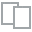
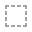
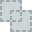
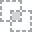
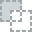
...
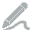
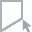
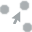
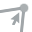
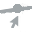

In [99]:
create_report(df_new)

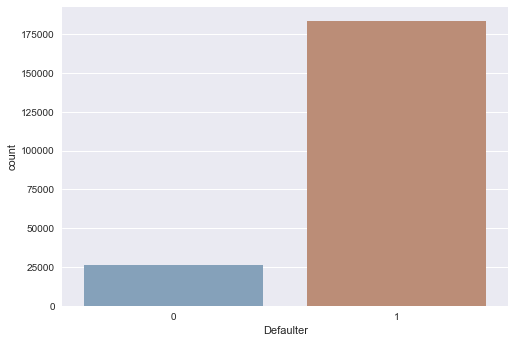

In [104]:
#According to analysis we have more percentage of True 1's than 0's ie, more percentage of Non-defaulter and less defaulter

sns.countplot(df_new['Defaulter'],palette='twilight_shifted')
plt.show()

In [27]:
# we will find the skewness of the dataset

df_new.skew()

aon                     10.391983
daily_decr30             3.945960
daily_decr90             4.252269
rental30                 4.560273
rental90                 4.467018
last_rech_date_ma       14.789615
last_rech_date_da       14.813496
last_rech_amt_ma         3.781161
cnt_ma_rech30            3.283895
fr_ma_rech30            14.771475
sumamnt_ma_rech30        6.386806
medianamnt_ma_rech30     3.512315
medianmarechprebal30    14.778525
cnt_ma_rech90            3.425244
fr_ma_rech90             2.285268
sumamnt_ma_rech90        4.897856
medianamnt_ma_rech90     3.752746
medianmarechprebal90    45.082795
cnt_da_rech30           17.816734
fr_da_rech30            14.775072
cnt_da_rech90           27.264830
fr_da_rech90            28.985447
cnt_loans30              2.713211
amnt_loans30             2.975507
maxamnt_loans30         17.656436
medianamnt_loans30       4.550701
cnt_loans90             16.592889
amnt_loans90             3.149773
maxamnt_loans90          1.678028
medianamnt_loa

We have skewness in many of the features which can be reduced by using power transformation

In [105]:
num_vars = df_new.columns

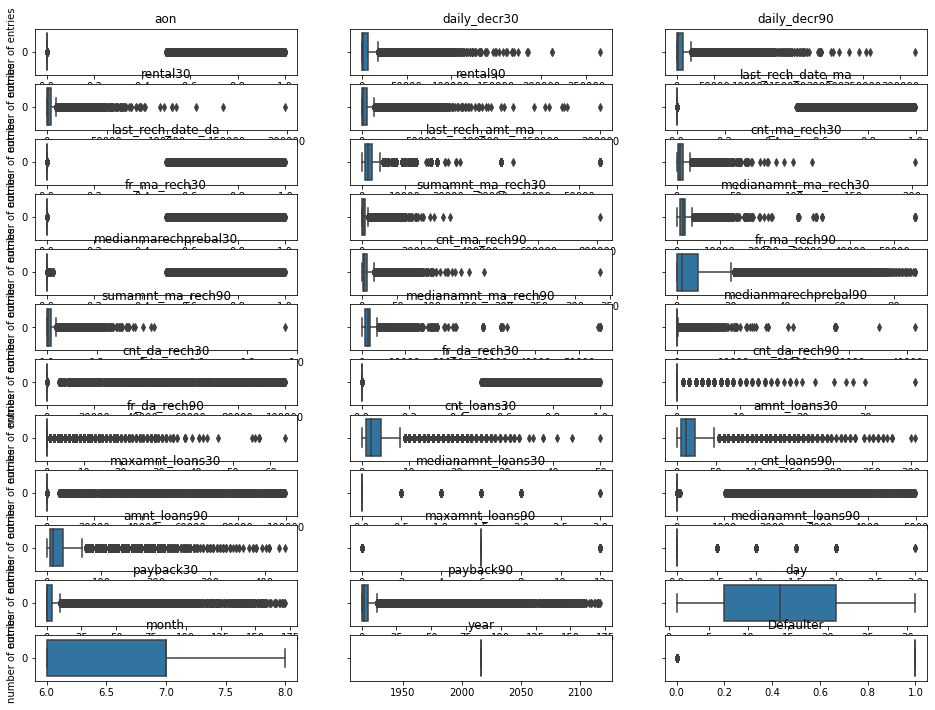

In [29]:
def boxplots_custom(dataset, columns_list, rows, cols, subtitle):
    fig, axs = plt.subplots(rows, cols, sharey=True, figsize=(16,12))
#     fig.subtitle(subtitle,y=0.63, size=14)
    axs = axs.flatten()
    for i, data in enumerate(columns_list):
        if i % 3 == 0:
            axs[i].set_ylabel('number of entries')
        sns.boxplot(data=dataset[data], orient='h', ax=axs[i])
        axs[i].set_title(data)
        
boxplots_custom(dataset=df_new, columns_list=num_vars, rows=12, cols=3, subtitle='Boxplots before deleting outliers')

We have outliers in many features. we treat it using quantiles method

In [31]:
# deleting outliers
Q1 = df_new[num_vars].quantile(0.25)
Q3 = df_new[num_vars].quantile(0.75)
IQR = Q3 - Q1
print('Here we will get IQR for each column\n',IQR)

df_new = df_new[~((df_new[num_vars] < (Q1 - 1.5 * IQR)) |(df_new[num_vars] > (Q3 + 1.5 * IQR))).any(axis=1)]
display(df_new.shape)

Here we will get IQR for each column
 aon                       736.000
daily_decr30             7203.537
daily_decr90             7761.630
rental30                 3063.240
rental90                 3875.345
last_rech_date_ma           6.000
last_rech_date_da           0.000
last_rech_amt_ma         1539.000
cnt_ma_rech30               4.000
fr_ma_rech30                6.000
sumamnt_ma_rech30        8471.000
medianamnt_ma_rech30     1154.000
medianmarechprebal30       73.600
cnt_ma_rech90               6.000
fr_ma_rech90                8.000
sumamnt_ma_rech90       13683.000
medianamnt_ma_rech90     1151.000
medianmarechprebal90       66.200
cnt_da_rech30               0.000
fr_da_rech30                0.000
cnt_da_rech90               0.000
fr_da_rech90                0.000
cnt_loans30                 3.000
amnt_loans30               18.000
maxamnt_loans30             0.000
medianamnt_loans30          0.000
cnt_loans90                 4.000
amnt_loans90               24.000
maxamnt_lo

(57201, 36)

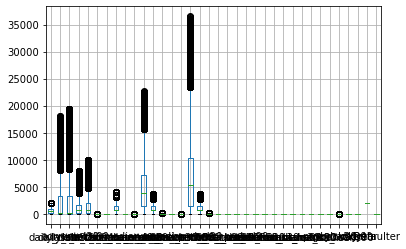

In [32]:
# boxplot after removing outliers(glance)
df_new.boxplot()
plt.show()

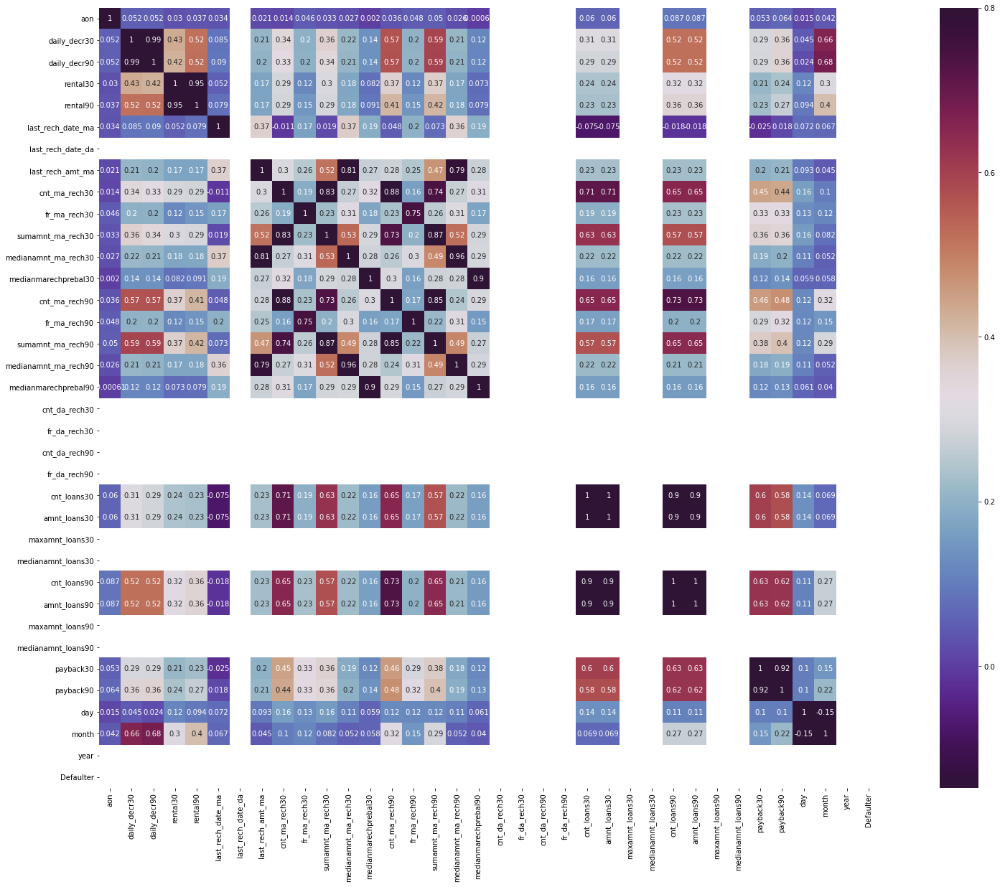

In [33]:
# heatmap of corelation of the dataset

df_corr = df_new.corr()
f, ax = plt.subplots(figsize = (30, 20))
sns.heatmap(df_corr, vmax = 0.8, square = True,annot=True, cmap = "twilight_shifted")
plt.show()

We will see the correlation between each of the features and the target feature. So by analysing the above heatmap we infer that none of the feature is affecting the target variable's relationship. So there will be no change in the target variable if any variance in the values of any feature. so we decide to drop only columns which doesnt impact on target variable.
1. last_rech_data_da
2. cnt_da_rech30
3. fr_da_rech30
4. cnt_da_rech90
5. fr_darech90
6. maxamnt_loans90
7. medianamnt_loans90

Finally we wont remove the defaulter column which is having only true 1's which are non defaulters instead we try to balance the dataset


In [34]:
df_new.drop(['last_rech_date_da','cnt_da_rech30','fr_da_rech30','cnt_da_rech90','fr_da_rech90','maxamnt_loans90','medianamnt_loans90'],axis=1,inplace=True)

In [35]:
df_new.shape

(57201, 29)

In [38]:
# we have 0 number of defaulters in the refined dataset so we will first fill 10 records with 0's

df_new['Defaulter']=df_new['Defaulter'][0:10].replace(1,0,inplace=False)

In [39]:
df_new

,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,payback30,payback90,day,month,year,Defaulter
2,535.0,1398.000000,1398.000000,900.13,900.13,3.0,1539,1,0.0,1539.0,1539.0,66.32,1,0,1539,1539.0,66.32,1,6,6.0,0.0,1.0,6,0.000000,0.000000,19,8,2016,0.0
4,947.0,150.619333,150.619333,1098.90,1098.90,4.0,2309,7,2.0,20029.0,2309.0,29.00,8,2,23496,2888.0,35.00,7,42,6.0,0.0,7.0,42,2.333333,2.333333,22,6,2016,0.0
8,1191.0,90.695000,90.695000,2287.50,2287.50,1.0,1539,4,1.0,6164.0,1539.0,39.90,4,1,6164,1539.0,39.90,4,24,6.0,0.0,4.0,24,2.666667,2.666667,15,6,2016,0.0
9,536.0,29.357333,29.357333,612.96,612.96,11.0,773,1,0.0,773.0,773.0,86.80,1,0,773,773.0,86.80,1,6,6.0,0.0,1.0,6,0.000000,0.000000,8,6,2016,0.0
10,1511.0,12.896000,12.896000,790.44,790.44,8.0,1539,2,5.0,2312.0,1156.0,16.83,2,5,2312,1156.0,16.83,2,12,6.0,0.0,2.0,12,4.000000,4.000000,12,6,2016,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
209579,155.0,11400.000000,16265.000000,3611.23,7196.49,3.0,1539,5,6.0,7695.0,1539.0,59.00,11,8,13856,1539.0,60.00,4,24,6.0,0.0,7.0,42,6.000000,6.142857,14,8,2016,NaN
209582,93.0,1062.400000,1065.500000,248.13,260.13,1.0,1539,1,0.0,1539.0,1539.0,4.00,1,0,1539,1539.0,4.00,1,6,6.0,0.0,1.0,6,0.000000,0.000000,6,7,2016,NaN
209583,935.0,15.550667,15.550667,140.44,140.44,4.0,1547,3,2.0,4641.0,1547.0,41.00,5,2,8508,1547.0,41.00,1,6,6.0,0.0,1.0,6,0.000000,0.000000,2,6,2016,NaN
209588,404.0,151.872333,151.872333,1089.19,1089.19,1.0,4048,3,2.0,10404.0,3178.0,91.81,3,2,10404,3178.0,91.81,2,12,6.0,0.0,2.0,12,1.000000,1.000000,17,6,2016,NaN


In [40]:
df_new=df_new.fillna(1)

In [41]:
df_new['Defaulter']=df_new.Defaulter.astype(int)

In [43]:
df_new.shape[0]

57201

In [44]:
# percentage of data loss

100-(df_new.shape[0]/df.shape[0])*100

72.70853511329099

Eventhough data is so expensive we happen to loose ~73% of the data after removing outliers

In [45]:
x= df_new.drop(['Defaulter'],axis=1)
y=df_new['Defaulter']

In [46]:
# removing skewness

from sklearn.preprocessing import power_transform
x= power_transform(x,method='yeo-johnson')

we have comparitively large number of samples for True 1's than 0's so we will upsample the 0's by using resampling 
technique


In [106]:
y.value_counts()

1    1999
0    1999
Name: Defaulter, dtype: int64

In [107]:
x= df_new.drop(['Defaulter'],axis=1)
y=df_new['Defaulter']

#### Resampling the dataset

In [50]:
from sklearn.utils import resample
x_train, x_test, y_train, y_test = train_test_split( x, y, test_size=0.33, random_state=42)
#combine them back for resampling
train_data = pd.concat([x_train, y_train], axis=1)
# separate minority and majority classes
train_data=train_data[0:2000]
No = train_data[train_data.Defaulter==0]
Yes = train_data[train_data.Defaulter==1]
# upsample minority
No_upsampled = resample(No,
 replace=True, # sample with replacement
 n_samples=len(Yes), # match number in majority class
 random_state=27) # reproducible results
# combine majority and upsampled minority
upsampled = pd.concat([Yes, No_upsampled])
# check new class counts
upsampled.Defaulter.value_counts()

1    1999
0    1999
Name: Defaulter, dtype: int64

In [51]:
x=upsampled.drop('Defaulter',axis=1)
y=upsampled['Defaulter']

In [52]:
#import all the necessary libraries
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import BernoulliNB
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import f1_score,recall_score,precision_score,roc_curve
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.model_selection import KFold, cross_val_score

#### Splitting of dataset into train & test set

In [53]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix,mean_squared_error,mean_absolute_error,roc_auc_score,roc_curve
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=42)

#### Scaling & Standardization 

In [54]:
from sklearn.preprocessing import MinMaxScaler,StandardScaler
n=MinMaxScaler()
n=n.fit(x_train)
new_x_train=n.transform(x_train)
new_x_test=n.transform(x_test)
scaler = StandardScaler()
new_x_train=scaler.fit_transform(new_x_train)
new_x_test=scaler.fit_transform(new_x_test)

In [55]:
models= [('lr',LogisticRegression()),('rfc',RandomForestClassifier()),('etc',ExtraTreesClassifier()),('bgc',BaggingClassifier()),
        ('gbc',GradientBoostingClassifier()),('dtc',DecisionTreeClassifier()),('knn',KNeighborsClassifier()),
        ('bnb',BernoulliNB()),('svc',SVC())]

#### Cross Validation scores

In [56]:
#function to find crossValidation score of different models

def basic_model_selection(x,y,cross_folds,model):
    scores=[]
    names = []
    for i,j in model:
        cv_scores = cross_val_score(j, x, y, cv=cross_folds,n_jobs=-1)
        scores.append(cv_scores)
        names.append(i)
    for k in range(len(scores)):
        print(names[k],scores[k].mean())

In [57]:
basic_model_selection(new_x_train,y_train,10,models)

lr 0.9937451018808778
rfc 1.0
etc 1.0
bgc 0.999375
gbc 1.0
dtc 0.999375
knn 0.9984375
bnb 0.9971845611285266
svc 0.9990625


#### Hyper parameter tuning of RFC

In [58]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score

# defining parameters

param_grid_rfc = {
    'n_estimators': [200, 700],
    'max_features': ['auto', 'sqrt', 'log2'],
    'criterion':['gini','entropy'],
    'random_state':[30,42,0],
    'max_depth':[2,1,0]
}


clf = GridSearchCV(RandomForestClassifier(),param_grid_rfc)
clf.fit(new_x_train,y_train)


rfcscore = cross_val_score(clf,new_x_train,y_train,cv=10)
rfcm = rfcscore.mean()
print('Cross Val Score of RFC:',rfcm*100)

print("Best Parameters %s" % clf.best_params_)


Cross Val Score of RFC: 99.84375
Best Parameters {'criterion': 'gini', 'max_depth': 2, 'max_features': 'auto', 'n_estimators': 200, 'random_state': 42}


#### Hyper parameter tuning of ETC

In [59]:
# Hyper parameter tuning of ExtraTreesClassifier
param_etc={
    "n_estimators":[5,50,250,500],
    "max_depth":[1,3,5,7,9],
    "criterion":['gini','entropy'],
    'max_features': ['auto', 'sqrt', 'log2'],
    'random_state':[30,27,42]
}
etc = GridSearchCV(ExtraTreesClassifier(),param_etc)
etc.fit(new_x_train,y_train)

etcscore = cross_val_score(ExtraTreesClassifier(),new_x_train,y_train,cv=2)
etcm = etcscore.mean()
print('Cross Val Score of ETC:',etcm*100)

print("Best Parameters %s" % etc.best_params_)

Cross Val Score of ETC: 100.0
Best Parameters {'criterion': 'gini', 'max_depth': 9, 'max_features': 'log2', 'n_estimators': 5, 'random_state': 27}


#### RandomForestClassifier Model

In [60]:
# implementing the model including best parameters

rfc= RandomForestClassifier(n_jobs=5,max_features= 'auto' ,n_estimators=200, oob_score = True,random_state=30,criterion='gini')
rfc.fit(new_x_train, y_train)
rfc.score(new_x_train, y_train)
pred_rfc = rfc.predict(new_x_test)

rfcs= accuracy_score(y_test,pred_rfc)
print('Accuracy Score',rfcs*100)

Accuracy Score 51.87500000000001


#### ExtraTreesClassifier Model

In [61]:
# implementing the ExtraTreesClassifier model including the best parameters

etc = ExtraTreesClassifier(n_jobs=5,max_features= 'auto' ,n_estimators=5, random_state=27,criterion='gini',max_depth=9)
etc.fit(new_x_train, y_train)
etc.score(new_x_train, y_train)
pred_etc = etc.predict(new_x_test)

etcs= accuracy_score(y_test,pred_etc)
print('Accuracy Score',etcs*100)

Accuracy Score 99.875


In [62]:
LogisticRegression().get_params().items()

dict_items([('C', 1.0), ('class_weight', None), ('dual', False), ('fit_intercept', True), ('intercept_scaling', 1), ('l1_ratio', None), ('max_iter', 100), ('multi_class', 'auto'), ('n_jobs', None), ('penalty', 'l2'), ('random_state', None), ('solver', 'lbfgs'), ('tol', 0.0001), ('verbose', 0), ('warm_start', False)])

#### Hyper parameter tuning of Logistic Regression

In [63]:
lr_param = {
    "C":[1.0,0.5,0.2],
    "solver" : ["lbfgs","linear"],
    "max_iter":[1,2,5],
    "random_state" :[32,42,0],
    "penalty": ["l1","l2"]
    
}

In [64]:
lg = GridSearchCV(LogisticRegression(),lr_param,n_jobs=-1,verbose=0)
lg.fit(new_x_train,y_train)
print(lg.estimator)
print(lg.best_params_)

LogisticRegression()
{'C': 1.0, 'max_iter': 5, 'penalty': 'l2', 'random_state': 32, 'solver': 'lbfgs'}


#### Logistic Regression

In [65]:
lr = LogisticRegression(C=1.0,max_iter= 5,penalty='l2', random_state=32,solver='lbfgs')
lr.fit(new_x_train,y_train)
lr.score(new_x_train,y_train)
lr.score(new_x_test,y_test)

0.9825

In [66]:
GradientBoostingClassifier().get_params().keys()

dict_keys(['ccp_alpha', 'criterion', 'init', 'learning_rate', 'loss', 'max_depth', 'max_features', 'max_leaf_nodes', 'min_impurity_decrease', 'min_impurity_split', 'min_samples_leaf', 'min_samples_split', 'min_weight_fraction_leaf', 'n_estimators', 'n_iter_no_change', 'random_state', 'subsample', 'tol', 'validation_fraction', 'verbose', 'warm_start'])

#### Hyper parameter tuning GBC

In [67]:
param_gbc={
    "n_estimators":[50,100,250,500],
    "learning_rate":[0.1,0.2,0.5],
    "criterion":['gini','entropy','friedman_mse'],
    'max_features': ['auto', 'sqrt', 'log2'],
    'random_state':[30,27,42],
    'max_depth':[2,3,5]
}

In [68]:
gbc = GridSearchCV(GradientBoostingClassifier(),param_gbc)
gbc.fit(new_x_train,y_train)
gbc_cv = cross_val_score(GradientBoostingClassifier(),new_x_train,y_train,cv=10)
gbcm=gbc_cv.mean()

print(gbcm)
print(gbc.best_params_)
print(gbc.best_score_)

1.0
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'max_depth': 2, 'max_features': 'sqrt', 'n_estimators': 100, 'random_state': 30}
1.0


#### Gradient Boosting Classifier

In [69]:
gbc_bv = GradientBoostingClassifier(criterion='friedman_mse',learning_rate=0.1,max_depth=2,max_features='auto',n_estimators=100,random_state=30)
gbc_bv.fit(new_x_train,y_train)
gbc_bv_pred = gbc_bv.predict(new_x_test)

In [71]:
# predict probabilities
pred_prob1 = rfc.predict_proba(new_x_test)
pred_prob2 = etc.predict_proba(new_x_test)
pred_prob3 = gbc.predict_proba(new_x_test)
pred_prob4 = lg.predict_proba(new_x_test)

In [72]:
fpr1, tpr1, thresh1 = roc_curve(y_test, pred_prob1[:,1], pos_label=1)
fpr2, tpr2, thresh2 = roc_curve(y_test, pred_prob2[:,1], pos_label=1)
fpr3, tpr3, thresh3 = roc_curve(y_test, pred_prob3[:,1], pos_label=1)
fpr4, tpr4, thresh4 = roc_curve(y_test, pred_prob4[:,1], pos_label=1)

# roc curve for tpr = fpr 
random_probs = [0 for i in range(len(y_test))]
p_fpr, p_tpr, _ = roc_curve(y_test, random_probs, pos_label=1)


from sklearn.metrics import roc_auc_score

# auc scores
auc_score1 = roc_auc_score(y_test, pred_prob1[:,1])
auc_score2 = roc_auc_score(y_test, pred_prob2[:,1])
auc_score3 = roc_auc_score(y_test, pred_prob3[:,1])
auc_score4 = roc_auc_score(y_test, pred_prob4[:,1])

print(auc_score1, auc_score2, auc_score3, auc_score4)

1.0 1.0 1.0 0.9927710843373494


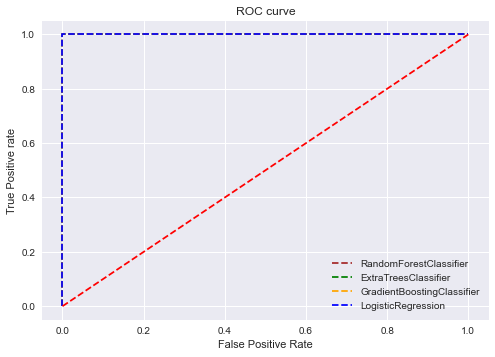

In [74]:
import matplotlib.pyplot as plt
plt.style.use('seaborn')

# plot roc curves
plt.plot(fpr1, tpr1, linestyle='--',color='brown', label='RandomForestClassifier')
plt.plot(fpr2, tpr2, linestyle='--',color='green', label='ExtraTreesClassifier')
plt.plot(fpr3, tpr3, linestyle='--',color='orange', label='GradientBoostingClassifier')
plt.plot(fpr3, tpr3, linestyle='--',color='blue', label='LogisticRegression')

plt.plot(p_fpr, p_tpr, linestyle='--', color='Red')
# title
plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')

plt.legend(loc='best')
plt.savefig('ROC',dpi=300)
plt.show()

[0.03741554 0.02210383 0.02625086 0.02035505 0.01078552 0.01264356
 0.03142841 0.0260275  0.02079019 0.0391457  0.04240271 0.03975672
 0.03757195 0.03264944 0.03366809 0.04843642 0.06477878 0.03415318
 0.02201354 0.         0.         0.02206805 0.03629591 0.02037695
 0.02282758 0.02890743 0.26714708 0.        ]


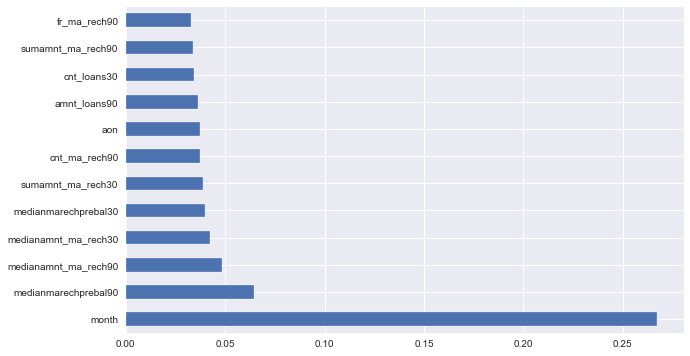

In [126]:
plt.rcParams['figure.figsize']=10,6 
sns.set_style("darkgrid")

from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model = ExtraTreesClassifier()
model.fit(new_x_train,y_train)
print(model.feature_importances_) 
feat_importances = pd.Series(model.feature_importances_, index=x_train.columns)
feat_importances.nlargest(12).plot(kind='barh')
plt.show()

In [124]:
import pickle
filename = 'defaulter.pkl'
pickle.dump(etc, open(filename, 'wb'))

In [125]:
loaded_model = pickle.load(open('defaulter.pkl', 'rb'))
result = loaded_model.score(new_x_test, y_test)
print(result*100)

99.875


In [127]:
conclusion=pd.DataFrame([loaded_model.predict(new_x_test)[:],y_test[:]],index=["Predicted","Original"])

In [128]:
conclusion

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799
Predicted,1,0,1,0,0,0,1,1,1,0,1,1,0,0,1,1,0,1,1,0,1,0,0,1,1,1,0,0,1,1,0,1,1,0,1,1,1,1,1,0,0,0,1,1,1,1,1,1,1,0,0,0,1,1,0,0,0,0,1,1,1,1,1,0,0,0,0,1,1,1,1,0,0,0,0,0,1,0,1,1,0,0,0,0,1,1,0,0,1,0,0,1,0,1,0,0,0,0,0,1,1,1,1,1,1,0,1,1,1,1,0,0,0,0,1,0,1,0,1,1,1,0,0,1,0,0,0,1,1,1,0,1,1,1,1,0,1,1,0,1,0,0,1,0,1,0,1,0,0,1,0,1,0,0,0,1,0,1,0,0,0,1,0,1,0,1,1,1,1,0,1,1,1,0,1,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,1,1,0,1,1,0,0,1,1,0,1,1,0,1,0,1,0,0,0,0,0,0,1,0,0,1,1,1,1,0,0,0,0,1,1,1,1,0,0,1,0,1,1,0,1,0,1,1,0,0,1,1,1,1,1,1,0,0,0,1,1,0,0,1,0,1,0,1,0,1,0,0,0,1,0,0,1,1,0,0,0,1,0,1,0,0,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,1,1,0,1,0,1,0,1,0,1,1,0,1,1,1,0,1,0,1,0,1,0,0,0,1,0,1,1,1,1,1,0,1,0,1,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,1,0,0,1,1,0,1,0,1,1,1,1,1,0,0,1,1,0,0,1,1,0,0,1,1,1,1,0,0,0,1,1,0,1,0,1,0,1,1,1,1,1,0,0,1,1,0,1,0,0,0,1,0,0,1,1,1,0,1,1,0,0,0,1,0,0,1,1,1,1,0,0,1,0,1,1,1,0,1,0,0,1,1,0,1,0,1,1,1,1,0,0,1,1,1,0,0,0,1,0,0,1,1,1,0,0,1,0